# 2D Kuramoto-Sivashinsky Equation Simulation

This notebook simulates the 2D Kuramoto-Sivashinsky equation, a model known for exhibiting spatio-temporal chaos. The simulation is performed on a periodic domain using a spectral method with a semi-implicit time-stepping scheme.

The equation is given by:
$$ \frac{\partial u}{\partial t} = -\nabla^2 u - \epsilon \nabla^4 u - \frac{\lambda}{2} |\nabla u|^2 $$
where the linear part $L = -\nabla^2 - \epsilon \nabla^4$ is unstable at large scales and stable at small scales, and the nonlinear term $-\frac{\lambda}{2} |\nabla u|^2$ provides saturation.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

## Parameters
Define the physical and numerical parameters for the simulation.

In [2]:
N = 128          # Grid resolution
L_box = 64.0     # Domain size (large enough to support chaotic dynamics)
dt = 0.05        # Time step
epsilon = 1.0    # Hyperdiffusion coefficient
lamb = 1.0       # Nonlinearity coefficient
n_steps = 6000   # Total time steps
steps_per_frame = 50 # Animation interval

## Spatial grid and wavenumbers
Set up the computational grid and the corresponding wavenumbers for the Fourier transform.

In [3]:
x = np.linspace(0, L_box, N, endpoint=False)
X, Y = np.meshgrid(x, x)

# Wavenumbers for FFT
k = 2 * np.pi * np.fft.fftfreq(N, d=L_box/N)
Kx, Ky = np.meshgrid(k, k)
K2 = Kx**2 + Ky**2
K4 = K2**2

## Initial condition
The simulation is initialized with small random noise to seed the growth of instabilities.

In [4]:
# Small random noise to seed the instability
np.random.seed(42)
u = 0.1 * (np.random.rand(N, N) - 0.5)

# Single peak initial condition
# u = np.zeros((N, N))
# u[np.floor(N//2), np.floor(N//2)] = 0.1  

# Transform to Fourier space
u_hat = np.fft.fft2(u)

## Simulation
The simulation uses a semi-implicit Euler scheme in Fourier space. The linear terms are handled implicitly for stability, while the nonlinear term is handled explicitly.

In [5]:
# Spectral operator for the linear part:
# Linear operator L = -del^2 - epsilon del^4 corresponds to k^2 - epsilon k^4 in Fourier space
L_linear = K2 - epsilon * K4

# Precompute denominator for semi-implicit Euler step
# Equation: u_t = L_linear * u + Nonlinear
# Semi-implicit Euler: (u_new - u_old)/dt = L_linear * u_new + Nonlinear_old
# (1 - dt * L_linear) * u_new = u_old + dt * Nonlinear_old
denom = 1 - dt * L_linear

u_movie = []

for i in range(n_steps):
    # Record frame
    if i % steps_per_frame == 0:
        u_real = np.real(np.fft.ifft2(u_hat))
        u_movie.append(u_real)
    
    # Compute nonlinear term in real space: -1/2 |grad u|^2
    # Calculate gradients in Fourier space then transform
    ux_hat = 1j * Kx * u_hat
    uy_hat = 1j * Ky * u_hat
    
    ux = np.real(np.fft.ifft2(ux_hat))
    uy = np.real(np.fft.ifft2(uy_hat))
    
    nonlinear_real = -0.5 * lamb * (ux**2 + uy**2)
    nonlinear_hat = np.fft.fft2(nonlinear_real)
    
    # Semi-implicit update
    u_hat = (u_hat + dt * nonlinear_hat) / denom

# Append final state
u_real = np.real(np.fft.ifft2(u_hat))
u_movie.append(u_real)

## Animation
Visualize the time evolution of the system.

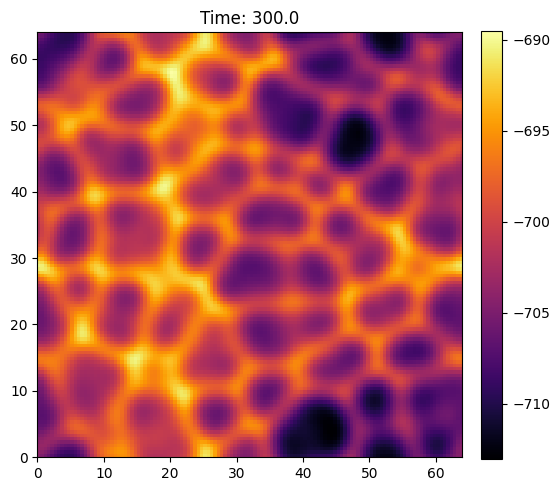

In [6]:
fig, ax = plt.subplots(figsize=(6, 6))
im = ax.imshow(u_movie[0], cmap='inferno', animated=True, origin='lower', extent=[0, L_box, 0, L_box])
ax.set_title('Kuramoto-Sivashinsky Evolution')
plt.colorbar(im, fraction=0.046, pad=0.04)

def update(frame):
    im.set_array(u_movie[frame])
    # Auto-scale color limits as the mean value drifts and patterns emerge
    im.set_clim(np.min(u_movie[frame]), np.max(u_movie[frame]))
    ax.set_title(f'Time: {frame * steps_per_frame * dt:.1f}')
    return im,

# Create the animation
anim = FuncAnimation(fig, update, frames=len(u_movie), blit=True, interval=50)

# Display the animation
HTML(anim.to_jshtml())